# Introduction to Grad-CAM
##### Grad-CAM (Gradient-weighted Class Activation Mapping) is a visualization technique used to interpret the predictions of convolutional neural networks (CNNs). It highlights regions in an input image that contribute most to the model's decision, enabling deeper insights into what the model has learned.

### Objective
The objective of this notebook is to:

Implement Grad-CAM for visualizing model interpretability.

Analyze correctly and incorrectly classified images to identify strengths and weaknesses of the model.

Improve model performance by addressing identified issues.

Document the process to create a teaching module for students and researchers.

### Dataset Overview
The dataset consists of four classes:

Larva_Foulbrood

Larva_Chalkbrood

Larva_Varroa_Mite

Larva_Normal

Each class includes correctly and incorrectly classified images for analysis.

### Model Building and Training
A custom CNN model was built and trained for the classification task.

The model was trained on a balanced and augmented dataset for robust learning.

### Grad-CAM Implementation
Grad-CAM was applied to generate heatmaps for visualizing which parts of the image the model focuses on.

Correctly classified images were analyzed for consistent and meaningful focus.

Misclassified images were examined to identify patterns and areas for improvement.

### Import Required Libraries

In [67]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import matplotlib.pyplot as plt
import numpy as np
import os
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import cv2
import pandas as pd
from collections import defaultdict

# Check for GPU availability
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

### Define the CNN Model
Recreate the CNN model architecture used during training to ensure compatibility when loading the saved weights.

In [68]:
# Define the CNN model (same as the one used during training)
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(128 * 16 * 16, 256)
        self.fc2 = nn.Linear(256, 4)  # 4 output classes
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = self.pool(torch.relu(self.conv1(x)))
        x = self.pool(torch.relu(self.conv2(x)))
        x = self.pool(torch.relu(self.conv3(x)))
        x = x.view(-1, 128 * 16 * 16)
        x = self.dropout(torch.relu(self.fc1(x)))
        x = self.fc2(x)
        return x

### Load the Saved Model
Use the .pth file generated during training to load the trained model's weights.

In [69]:
# Instantiate the model
model = CNN().to(device)

# Load the trained weights
model_path = 'larvaeclassifyCNN_model.pth'  # Ensure the correct path is provided
model.load_state_dict(torch.load(model_path))
model.eval()  # Set model to evaluation mode
print("Model loaded successfully!")


Model loaded successfully!


C:\Users\khush\AppData\Local\Temp\ipykernel_85744\207272756.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


### Load the Validation Dataset

In [70]:
# Define the transformations for validation data (same as used during training)

transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Resize images to 128x128 pixels
    transforms.ToTensor(),  # Convert images to PyTorch tensors
    transforms.Lambda(lambda x: x.repeat(3, 1, 1) if x.shape[0] == 1 else x)  # Ensure 3 channels
])

# Define validation data directory
val_dir = r"C:\Users\khush\OneDrive\Documents\EcoUp\CNN Model\Validation"

# Load validation dataset
val_data = datasets.ImageFolder(root=val_dir, transform=transform)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=32)

# Map classes to English names (if required)
class_name_mapping = {
    '유충_정상': 'Larva_Normal',
    '유충_응애': 'Larva_Varroa_Mite',
    '유충_부저병': 'Larva_Foulbrood',
    '유충_석고병': 'Larva_Chalkbrood'
}
val_data.classes = [class_name_mapping[cls] for cls in val_data.classes]

print("Validation dataset loaded successfully!")
print("Classes:", val_data.classes)


Validation dataset loaded successfully!
Classes: ['Larva_Foulbrood', 'Larva_Chalkbrood', 'Larva_Varroa_Mite', 'Larva_Normal']


### Define Grad-CAM 

In [86]:
def gradcam_analysis(image_tensor, true_label, pred_label, model, class_names, return_heatmap=False):
    """
    Perform Grad-CAM analysis on an input image tensor.
    """
    # Target the appropriate layer
    target_layer = model.conv3  # Update this based on the model architecture
    cam = GradCAM(model=model, target_layers=[target_layer], reshape_transform=None)

    # Ensure image tensor is RGB
    if image_tensor.shape[0] == 1:  # Check if grayscale
        image_tensor = image_tensor.repeat(3, 1, 1)  # Convert to RGB

    # Add batch dimension and move to device
    input_tensor = image_tensor.unsqueeze(0).to(device)

    # Generate Grad-CAM heatmap
    grayscale_cam = cam(input_tensor=input_tensor, targets=[ClassifierOutputTarget(true_label)])
    grayscale_cam = grayscale_cam[0, :]  # Remove batch dimension

    if return_heatmap:
        return grayscale_cam

    # Convert tensor to numpy for visualization
    img_np = image_tensor.permute(1, 2, 0).cpu().numpy()  # HWC format
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())  # Normalize to [0, 1]
    img_np = (img_np * 255).astype(np.uint8)  # Scale to [0, 255] and convert to uint8

    heatmap = cv2.applyColorMap(np.uint8(255 * grayscale_cam), cv2.COLORMAP_JET)
    heatmap = cv2.resize(heatmap, (img_np.shape[1], img_np.shape[0]))  # Resize heatmap to match image
    overlay = cv2.addWeighted(img_np, 0.6, heatmap, 0.4, 0)  # Blend image and heatmap

    # Plot Grad-CAM visualization
    plt.figure(figsize=(8, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(img_np)
    plt.title(f"True: {class_names[true_label]}, Pred: {class_names[pred_label]}")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title("Grad-CAM Heatmap")
    plt.axis('off')
    plt.show()

In [106]:
# def gradcam_analysis(image_tensor, true_label, pred_label, model, class_names, return_heatmap=False):
#     target_layer = model.conv3  # Specify the target layer
#     cam = GradCAM(model=model, target_layers=[target_layer], reshape_transform=None)

#     # Ensure the image tensor is RGB
#     if image_tensor.shape[0] == 1:  # Check if grayscale
#         image_tensor = image_tensor.repeat(3, 1, 1)  # Repeat channels to convert to RGB

#     # Add batch dimension
#     input_tensor = image_tensor.unsqueeze(0).to(device)

#     # Generate heatmap
#     grayscale_cam = cam(input_tensor=input_tensor, targets=[ClassifierOutputTarget(true_label)])
#     grayscale_cam = grayscale_cam[0, :]  # Remove batch dimension

#     if return_heatmap:
#         return grayscale_cam

#     # Convert tensor to numpy for visualization
#     img_np = image_tensor.permute(1, 2, 0).cpu().numpy()
#     img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())  # Normalize for display
#     img_np = (img_np * 255).astype(np.uint8)  # Convert to uint8

#     # Debugging: Ensure shapes and types
#     print("Image Shape:", img_np.shape, "Type:", img_np.dtype)  # Should be (H, W, 3), uint8
#     heatmap = cv2.applyColorMap(np.uint8(255 * grayscale_cam), cv2.COLORMAP_JET)
#     heatmap = heatmap.astype(np.uint8)



#     print("Heatmap Shape:", heatmap.shape, "Type:", heatmap.dtype)  # Should match img_np

#     # Ensure both arrays have the same type
#     if heatmap.dtype != img_np.dtype:
#         heatmap = heatmap.astype(np.uint8)

#     # Overlay heatmap on the image
#     overlay = cv2.addWeighted(img_np.astype(np.uint8), 0.6, heatmap, 0.4, 0)

#     # Debugging: Check overlay type and shape
#     print("Overlay Shape:", overlay.shape, "Type:", overlay.dtype)

#     return overlay


### Generating Grad-CAM Heatmaps
We’ll divide the validation images into correctly classified and misclassified images, and group them by their true classes and generate heatmaps for each class.

In [74]:
# Initialize storage for correctly and misclassified images
correctly_classified_images = []
misclassified_images = []

# Iterate over the validation set
for img_tensor, label in val_loader:
    img_tensor = img_tensor.to(device)
    label = label.to(device)

    # Predict the class
    outputs = model(img_tensor)
    _, predicted = torch.max(outputs, 1)

    for i in range(len(label)):  # Iterate over the batch
        if predicted[i] == label[i]:
            correctly_classified_images.append((img_tensor[i], label[i].item(), predicted[i].item()))
        else:
            misclassified_images.append((img_tensor[i], label[i].item(), predicted[i].item()))

# Print basic stats
print(f"Number of correctly classified images: {len(correctly_classified_images)}")
print(f"Number of misclassified images: {len(misclassified_images)}")

Number of correctly classified images: 1689
Number of misclassified images: 311



Grad-CAM Analysis for Class: Larva_Foulbrood
Correctly Classified: 348 samples


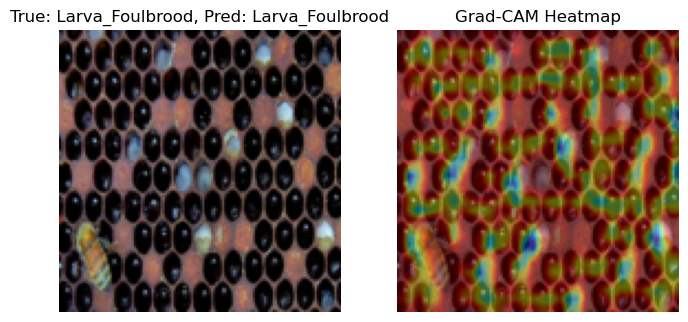

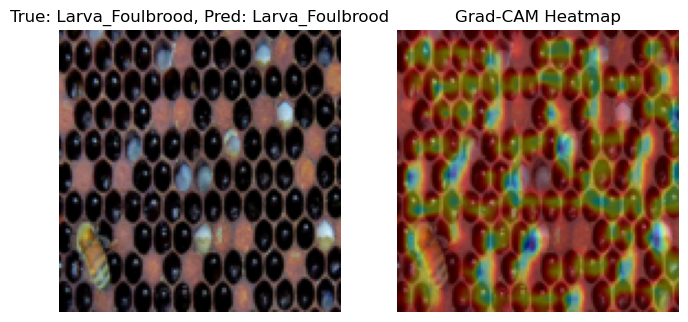

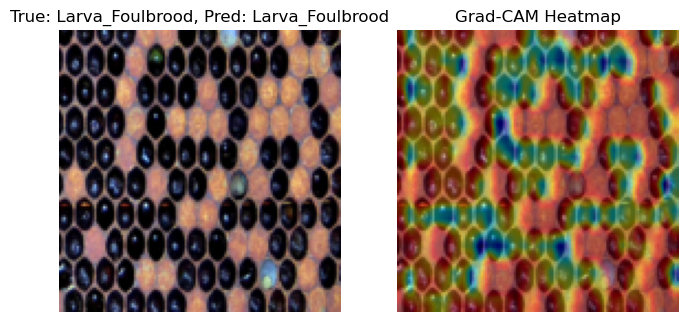

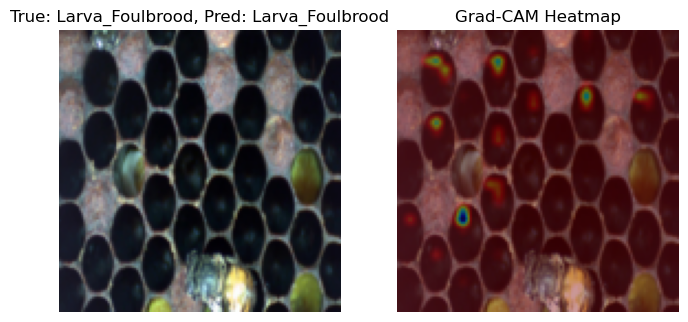

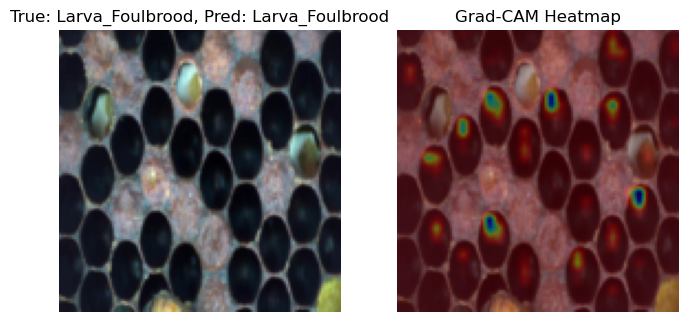

Misclassified: 152 samples


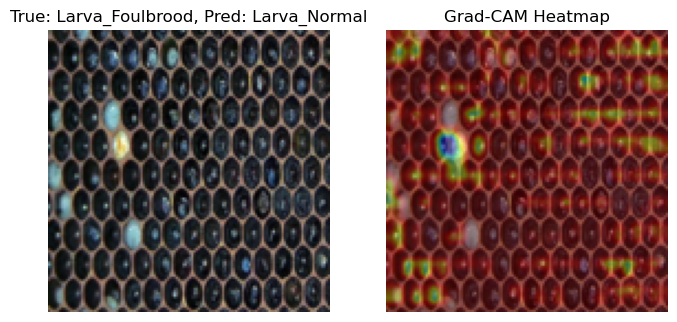

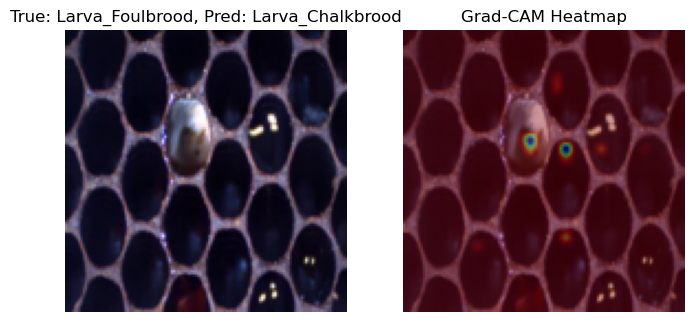

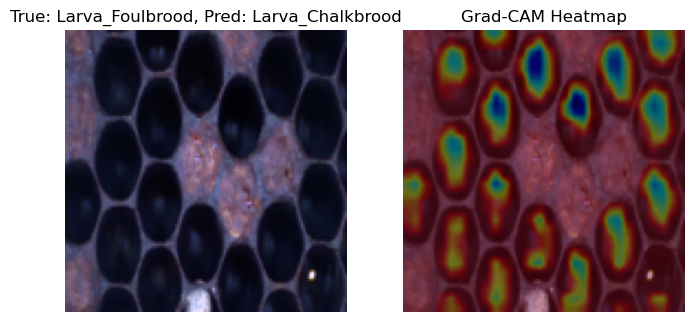

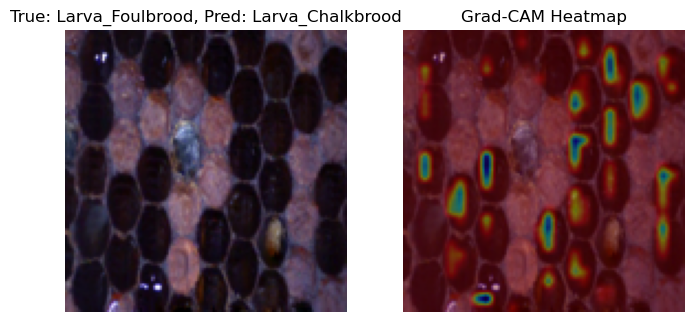

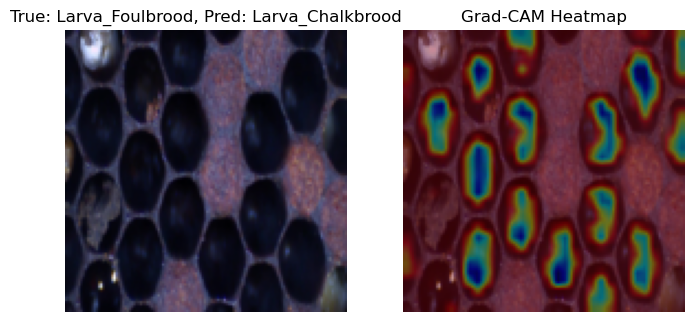


Grad-CAM Analysis for Class: Larva_Chalkbrood
Correctly Classified: 350 samples


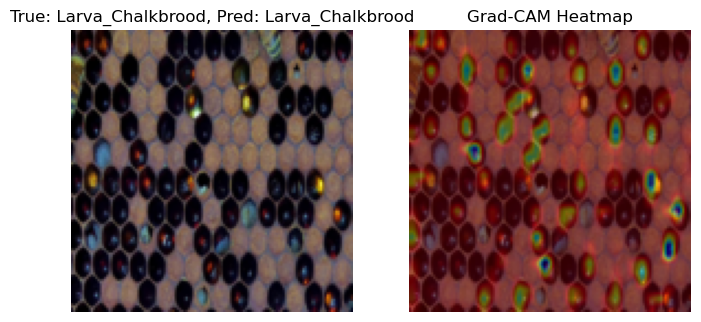

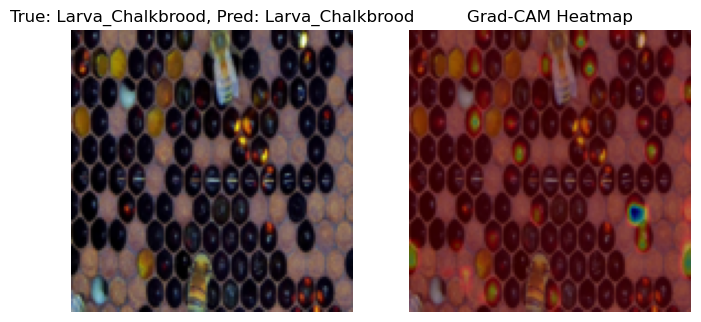

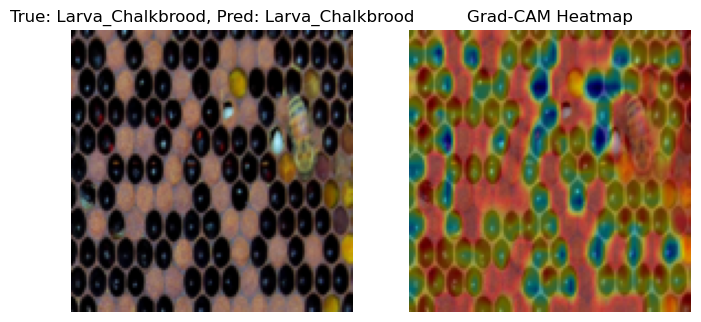

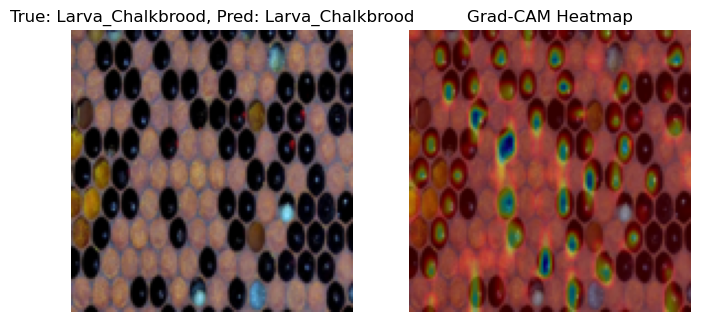

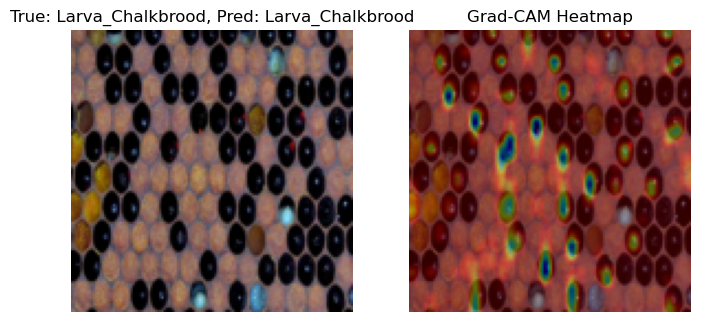

Misclassified: 150 samples


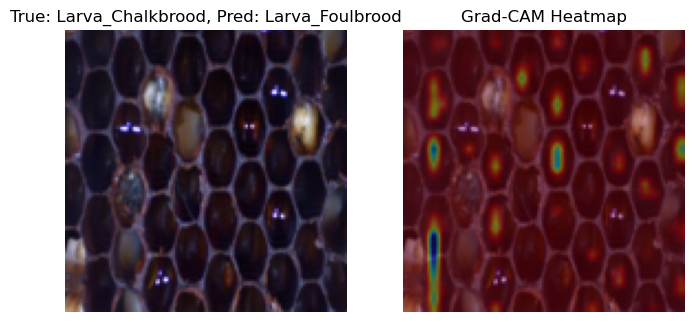

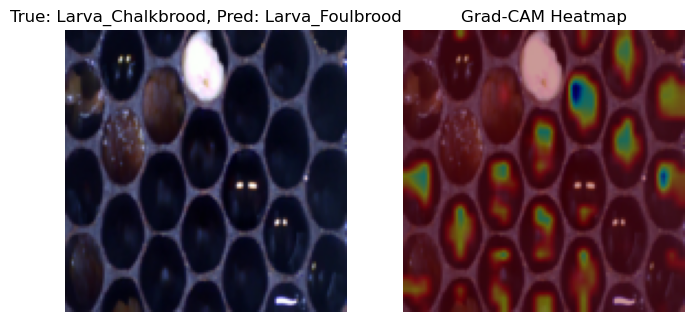

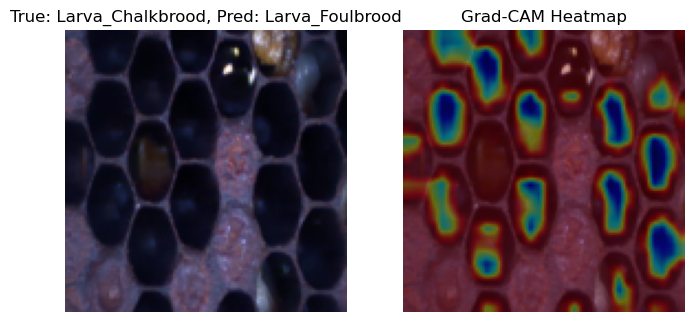

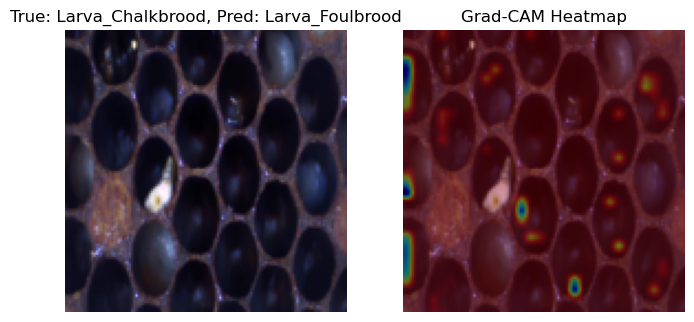

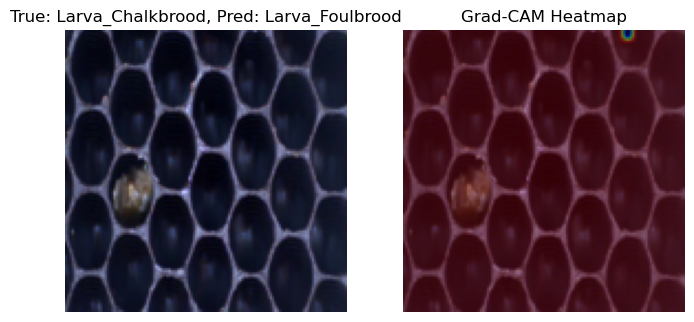


Grad-CAM Analysis for Class: Larva_Varroa_Mite
Correctly Classified: 495 samples


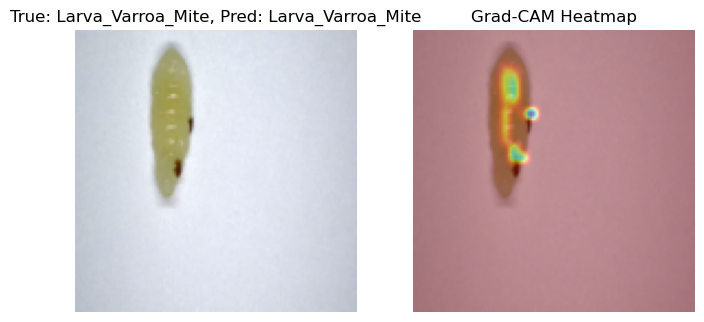

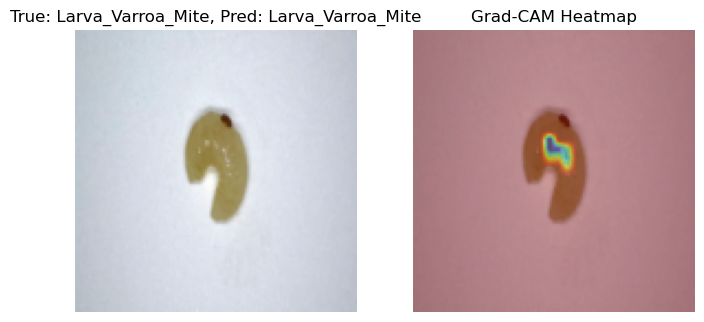

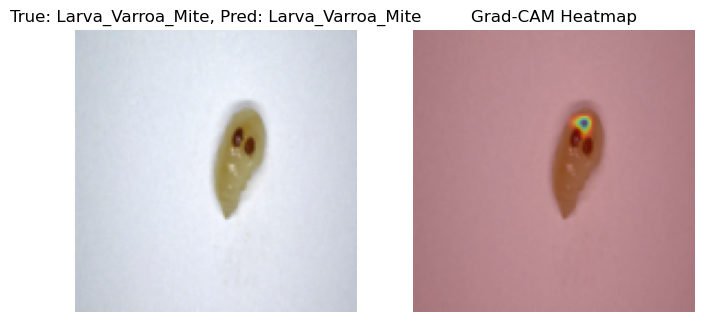

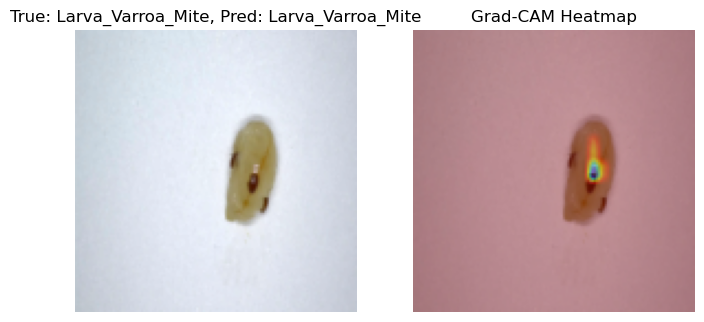

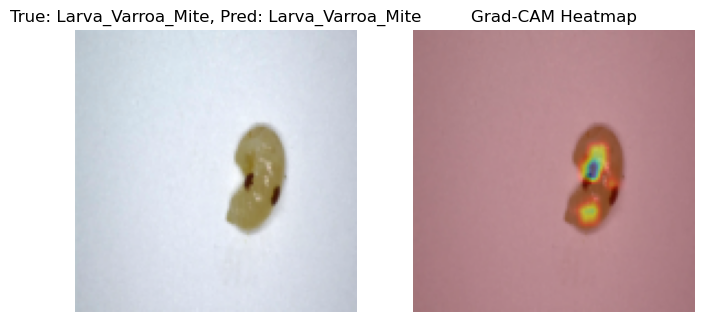

Misclassified: 5 samples


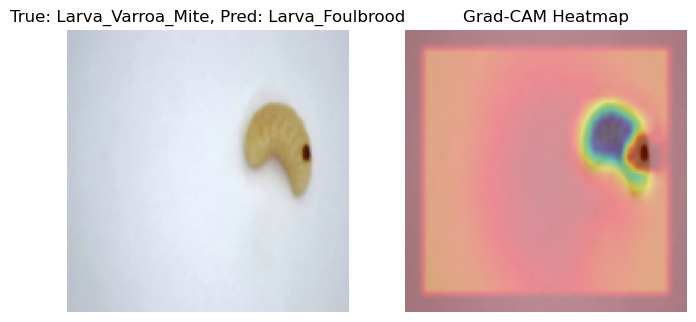

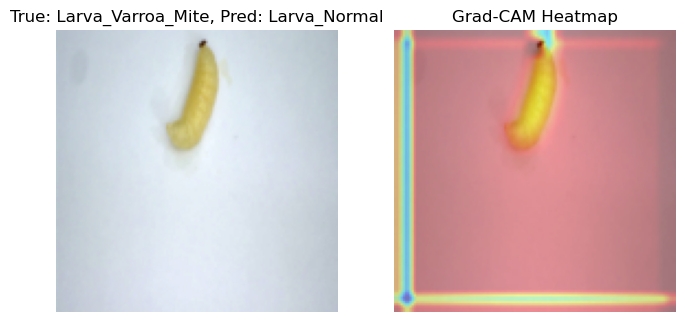

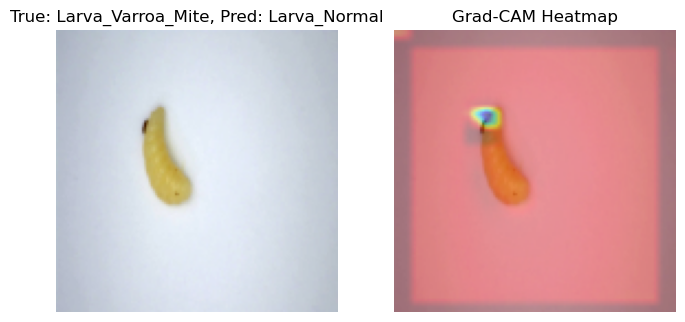

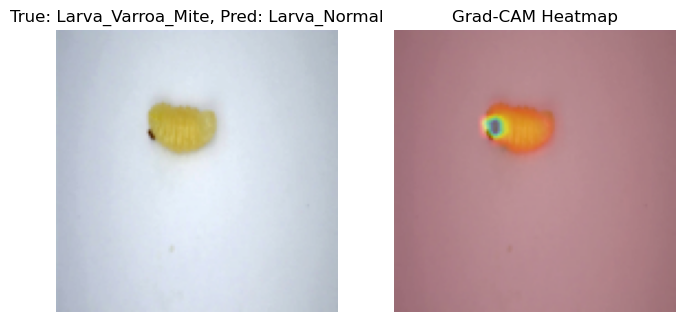

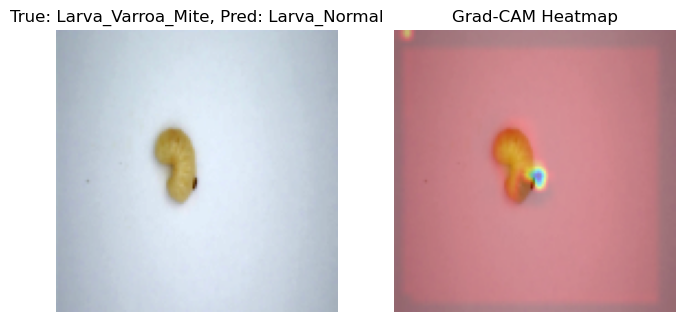


Grad-CAM Analysis for Class: Larva_Normal
Correctly Classified: 496 samples


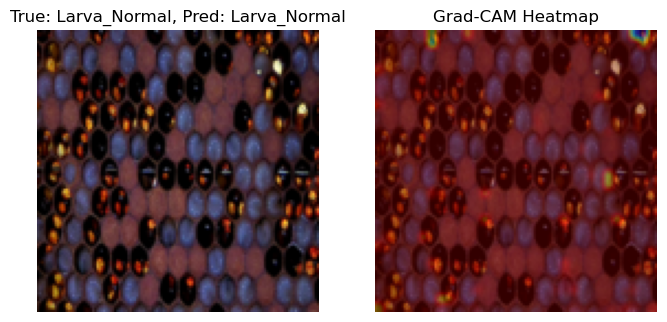

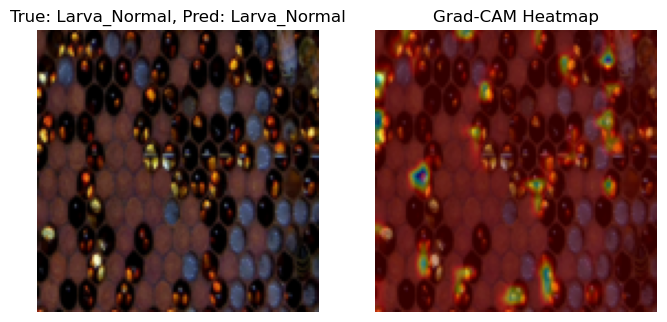

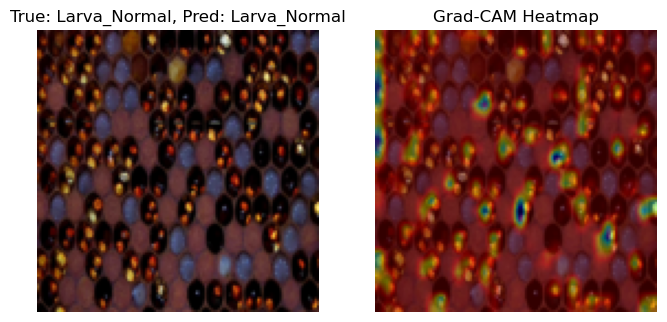

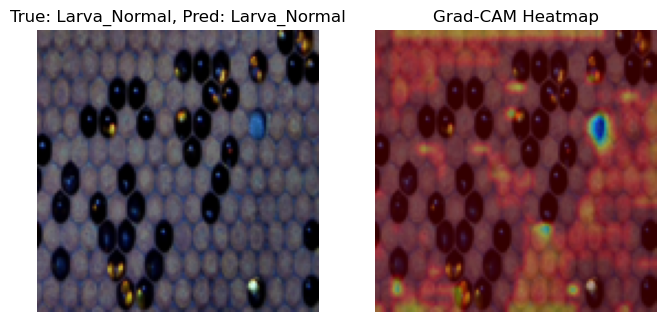

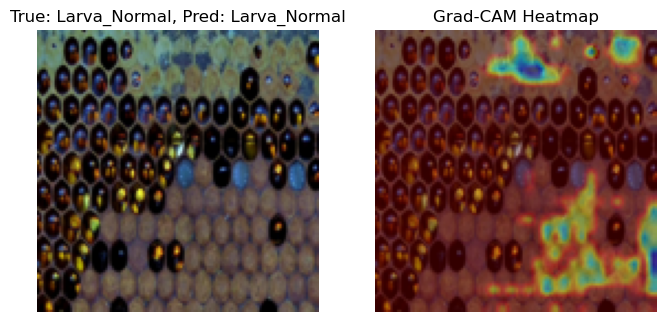

Misclassified: 4 samples


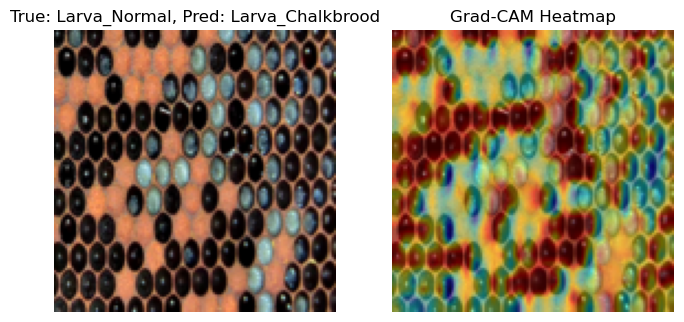

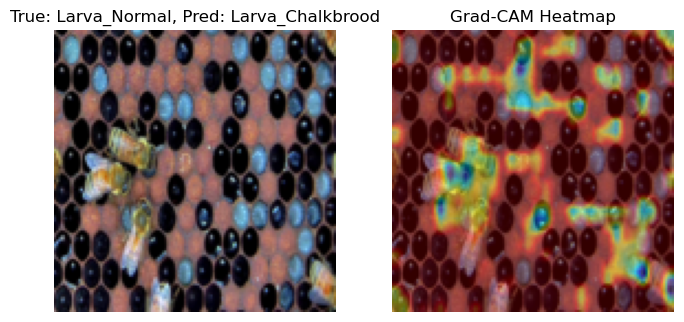

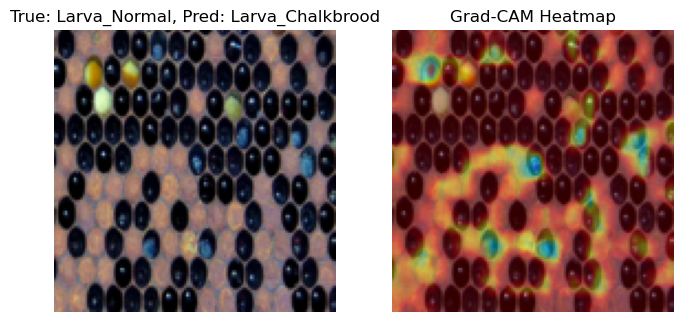

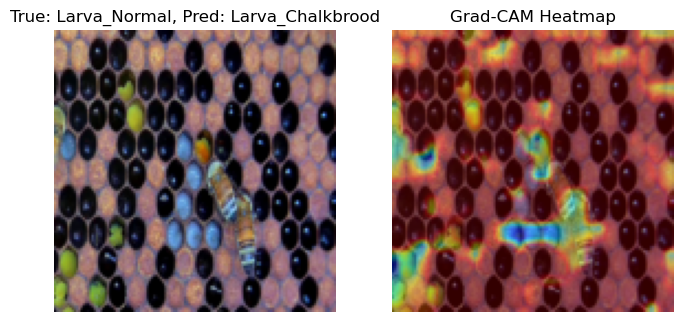

In [88]:
# Grad-CAM per class
for class_idx, class_name in enumerate(val_data.classes):
    print(f"\nGrad-CAM Analysis for Class: {class_name}")

    # Correctly classified images
    correct_images = [
        (img, true_label, pred_label)
        for img, true_label, pred_label in correctly_classified_images
        if true_label == class_idx
    ]
    print(f"Correctly Classified: {len(correct_images)} samples")

    for img, true_label, pred_label in correct_images[:5]:  # Analyze top 5
        # Ensure the image tensor is RGB
        if img.shape[0] == 1:  # Check if grayscale
            img = img.repeat(3, 1, 1)  # Convert to RGB by duplicating channels
        gradcam_analysis(img, true_label, pred_label, model, val_data.classes)

    # Misclassified images
    misclassified_images_class = [
        (img, true_label, pred_label)
        for img, true_label, pred_label in misclassified_images
        if true_label == class_idx
    ]
    print(f"Misclassified: {len(misclassified_images_class)} samples")

    for img, true_label, pred_label in misclassified_images_class[:5]:  # Analyze top 5
        # Ensure the image tensor is RGB
        if img.shape[0] == 1:  # Check if grayscale
            img = img.repeat(3, 1, 1)  # Convert to RGB by duplicating channels
        gradcam_analysis(img, true_label, pred_label, model, val_data.classes)

### Quantitative Analysis

To summarize results for each class:
1. Number of correctly classified images
2. Number of misclassified images
3. Common classes it is confused with
4. Average confidence scores for correct and incorrect predictions

In [90]:
# Initialize metrics
results_summary = defaultdict(lambda: {
    'Correct': 0,
    'Incorrect': 0,
    'Confused With': defaultdict(int),
    'Correct Confidences': [],
    'Incorrect Confidences': []
})

# Analyze correctly classified images
for img, true_label, pred_label in correctly_classified_images:  # Adjusted to expect 3 elements
    class_name = val_data.classes[true_label]
    results_summary[class_name]['Correct'] += 1

    # Calculate confidence score dynamically
    img_tensor = img.unsqueeze(0).to(device)  # Add batch dimension and move to GPU
    with torch.no_grad():
        output = model(img_tensor)
        probabilities = torch.nn.functional.softmax(output, dim=1)
        confidence = probabilities[0, pred_label].item()
    results_summary[class_name]['Correct Confidences'].append(confidence)

# Analyze misclassified images
for img, true_label, pred_label in misclassified_images:  # Adjusted to expect 3 elements
    true_class = val_data.classes[true_label]
    pred_class = val_data.classes[pred_label]
    results_summary[true_class]['Incorrect'] += 1
    results_summary[true_class]['Confused With'][pred_class] += 1

    # Calculate confidence score dynamically
    img_tensor = img.unsqueeze(0).to(device)  # Add batch dimension and move to GPU
    with torch.no_grad():
        output = model(img_tensor)
        probabilities = torch.nn.functional.softmax(output, dim=1)
        confidence = probabilities[0, pred_label].item()
    results_summary[true_class]['Incorrect Confidences'].append(confidence)

# Create a summary table
summary_table = []
for class_name, metrics in results_summary.items():
    avg_correct_conf = np.mean(metrics['Correct Confidences']) if metrics['Correct Confidences'] else 0
    avg_incorrect_conf = np.mean(metrics['Incorrect Confidences']) if metrics['Incorrect Confidences'] else 0
    common_confusions = sorted(metrics['Confused With'].items(), key=lambda x: x[1], reverse=True)[:3]
    summary_table.append([
        class_name,
        metrics['Correct'],
        metrics['Incorrect'],
        ", ".join([f"{cls} ({count})" for cls, count in common_confusions]),
        f"{avg_correct_conf:.2f}",
        f"{avg_incorrect_conf:.2f}"
    ])

# Display the results as a dataframe
summary_df = pd.DataFrame(summary_table, columns=["Class", "Correct", "Incorrect", "Top Confused Classes", "Avg Correct Confidence", "Avg Incorrect Confidence"])

# Save to CSV for reporting
summary_df.to_csv("gradcam_classification_summary.csv", index=False)


In [91]:
summary_df 

,Class,Correct,Incorrect,Top Confused Classes,Avg Correct Confidence,Avg Incorrect Confidence
0,Larva_Foulbrood,348,152,"Larva_Chalkbrood (146), Larva_Normal (6)",0.82,0.69
1,Larva_Chalkbrood,350,150,"Larva_Foulbrood (144), Larva_Normal (6)",0.79,0.71
2,Larva_Varroa_Mite,495,5,"Larva_Normal (4), Larva_Foulbrood (1)",0.99,0.66
3,Larva_Normal,496,4,Larva_Chalkbrood (4),0.99,0.85


#### Observations:

##### Class Distribution of Correct vs. Incorrect Predictions:

Larva_Normal has the highest number of correct classifications (496) and the fewest misclassifications (4), with an impressive average correct confidence of 0.99. This indicates the model is very confident and accurate in identifying this class. Larva_Varroa_Mite also has strong performance, with 495 correct predictions and only 5 misclassifications. The model confidently classifies these images correctly (avg confidence: 0.99) but is less confident in its incorrect predictions (avg confidence: 0.66).

##### High Misclassification Rates:

Larva_Foulbrood and Larva_Chalkbrood have relatively higher misclassification rates:
Larva_Foulbrood: 152 misclassifications.
Larva_Chalkbrood: 150 misclassifications.
These two classes seem to be confused with each other frequently, as indicated by the "Top Confused Classes" column. For instance:
Larva_Foulbrood is misclassified as Larva_Chalkbrood 146 times.
Larva_Chalkbrood is misclassified as Larva_Foulbrood 144 times.

##### Confidence Scores:

Incorrect predictions tend to have lower confidence scores across all classes, suggesting the model struggles more when the decision boundary between classes is ambiguous. Larva_Normal stands out with the highest incorrect confidence (0.85), potentially indicating overconfidence in certain errors.

#### Inferences:

High Confusion Between Larva_Foulbrood and Larva_Chalkbrood: These two classes may share similar visual features (e.g., texture, color, patterns), leading to frequent misclassifications. Data imbalance or insufficient feature representation could be contributing factors.

##### Strong Performance for Larva_Normal and Larva_Varroa_Mite: 
The model performs exceptionally well on these two classes, likely due to distinct features that make them easier to classify.

##### Confidence Trends:

The difference in average confidence between correct and incorrect predictions indicates the model's uncertainty in ambiguous cases.
Misclassifications of Larva_Foulbrood and Larva_Chalkbrood have the lowest incorrect confidence scores (0.69 and 0.71), reflecting the challenge in distinguishing between these classes.


### Visual Comparison
Create side-by-side visualizations of original images and their Grad-CAM heatmaps


Grad-CAM Visualization for Class: Larva_Foulbrood
--------------------------------------------------


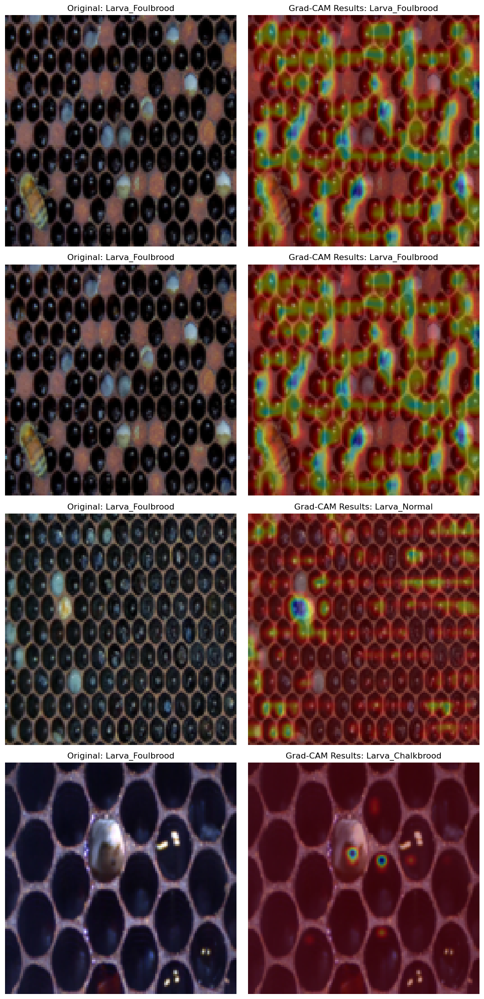


Grad-CAM Visualization for Class: Larva_Chalkbrood
--------------------------------------------------


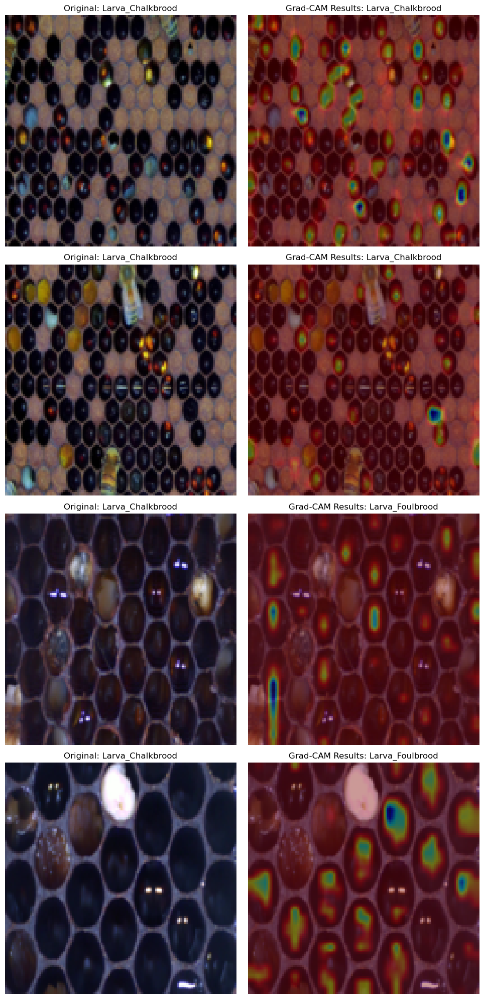


Grad-CAM Visualization for Class: Larva_Varroa_Mite
--------------------------------------------------


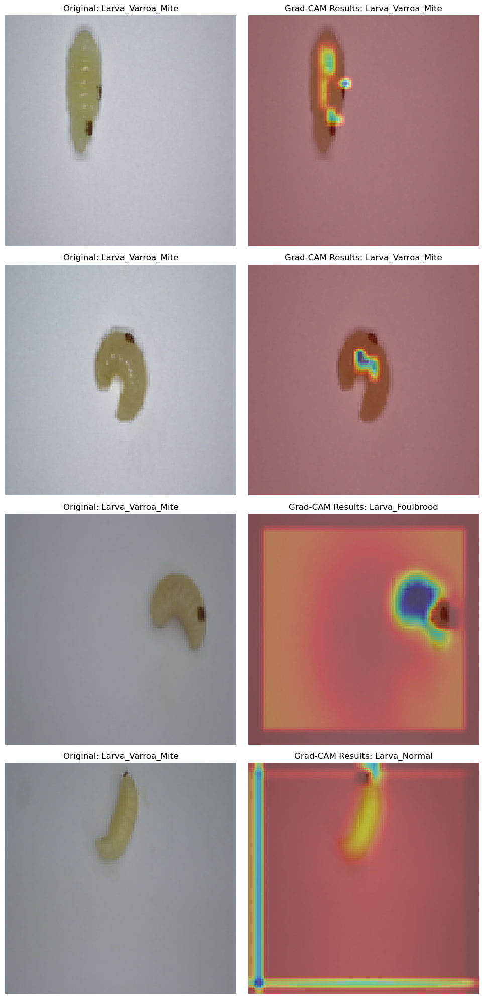


Grad-CAM Visualization for Class: Larva_Normal
--------------------------------------------------


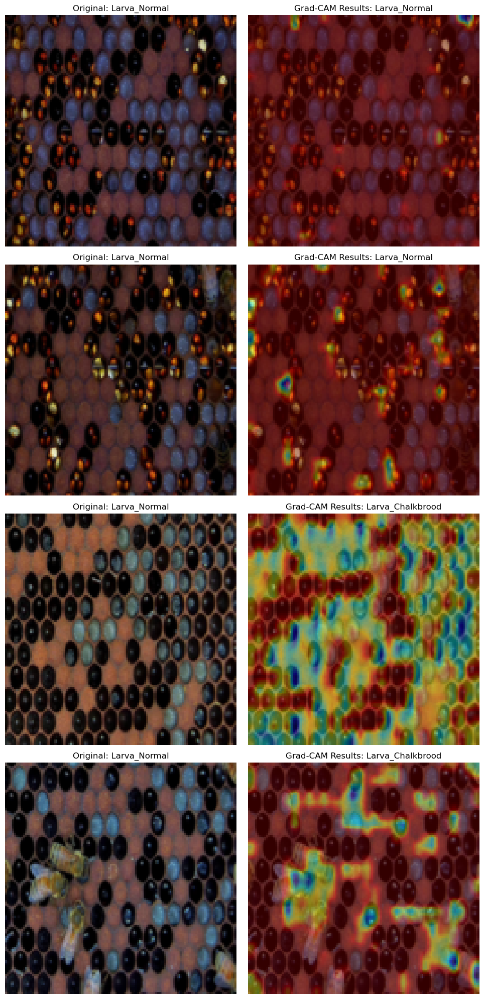

In [116]:
def visualize_results_per_class(correct_images, incorrect_images, class_names):
    """
    Visualize Grad-CAM results per class for both correct and misclassified images.
    """
    for class_idx, class_name in enumerate(class_names):
        print(f"\nGrad-CAM Visualization for Class: {class_name}")
        print("-" * 50)
        
        # Correctly classified images for this class
        correct_samples = [
            (img, true_label, pred_label) 
            for img, true_label, pred_label in correct_images 
            if true_label == class_idx
        ][:2]  # Select up to 2 samples

        # Misclassified images for this class
        incorrect_samples = [
            (img, true_label, pred_label) 
            for img, true_label, pred_label in incorrect_images 
            if true_label == class_idx
        ][:2]  # Select up to 2 samples
        
        # Combine and visualize
        samples = correct_samples + incorrect_samples
        fig, axs = plt.subplots(len(samples), 2, figsize=(10, 5 * len(samples)))
        
        for i, (img, true_label, pred_label) in enumerate(samples):
            if img.shape[0] == 1:  # Convert grayscale to RGB
                img = img.repeat(3, 1, 1)
            
            # Generate heatmap
            gradcam_heatmap = gradcam_analysis(img, true_label, pred_label, model, class_names, return_heatmap=True)
            
            # Overlay heatmap on the image
            overlay = overlay_heatmap_on_image(img, gradcam_heatmap)
            
            # Original image
            axs[i, 0].imshow(img.permute(1, 2, 0).cpu().numpy())
            axs[i, 0].set_title(f"Original: {class_names[true_label]}", fontsize=12)
            axs[i, 0].axis("off")
            
            # Heatmap overlay
            axs[i, 1].imshow(overlay)
            axs[i, 1].set_title(f"Grad-CAM Results: {class_names[pred_label]}", fontsize=12)
            axs[i, 1].axis("off")
        
        # Adjust layout to prevent overlap
        plt.tight_layout()  # Remove the overall title
        plt.show()

# Call the function
visualize_results_per_class(
    correctly_classified_images,
    misclassified_images,
    val_data.classes
)


### Inferences on Generated Heatmaps

### Class: Larva_Foulbrood

#### Observations:
Correctly classified images focus on meaningful areas (e.g., unique cell patterns or larval features).
Misclassified images are often confused with Larva_Chalkbrood or Larva_Normal.
Heatmaps for misclassified samples sometimes focus on overlapping or irrelevant features.

#### Inferences:
The model has learned relevant features for correct classifications.
Misclassifications suggest visual similarity between Larva_Foulbrood and other classes, or potential reliance on spurious features.

#### Suggestions:
Increase diversity in training images to better capture unique Larva_Foulbrood features.
Add augmented data emphasizing distinct patterns.
Conduct additional error analysis to identify borderline cases.


### Class: Larva_Chalkbrood

####  Observations:
Correctly classified heatmaps focus on infected larval regions, often highlighting distinct features.
Misclassified images are frequently labeled as Larva_Foulbrood, likely due to overlapping visual patterns or ambiguous features.
    
#### Inferences:
The model is effective for clear samples but struggles with borderline or low-quality images.
Ambiguity in labeling or similar features may contribute to confusion.

#### Suggestions:
Review and refine the training dataset to include clearer distinctions between Larva_Chalkbrood and other classes.
Introduce augmentations such as contrast adjustments to highlight subtle differences.
Increase the number of training samples to improve feature representation.

### Class: Larva_Varroa_Mite

#### Observations:
Correctly classified samples show heatmaps focusing on mite regions, indicating effective learning of unique features.
Misclassified samples are rarely confused but tend to focus on irrelevant areas such as edges or the background.

#### Inferences:
The model performs well for this class due to the distinctiveness of mites.
Misclassifications may result from variability in image conditions or mite appearance.
    
#### Suggestions:
Augment data with varied lighting and rotation to account for environmental differences.
Collect additional training samples featuring mites in diverse scenarios.
Ensure consistent focus on mite regions across the dataset.

### Class: Larva_Normal

#### Observations:
Correctly classified samples consistently highlight healthy larval regions.
Misclassified images are occasionally labeled as Larva_Chalkbrood, suggesting overlap in features such as cell shape or texture.

#### Inferences:
The model effectively distinguishes normal larvae from other classes when features are clear.
Misclassifications indicate ambiguity in borderline cases or noisy training data.

#### Suggestions:
Review and refine training data to address labeling ambiguities.
Use advanced augmentation to emphasize differences between healthy and infected larvae.
Introduce a small number of curated, high-quality samples to improve class separation.